In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import hilbert
import os.path as op
import pandas as pd
import os
import mne
import csv
import glob
from mne.io import read_epochs_fieldtrip
from mne import create_info
from scipy.signal.windows import hann
import scipy.io
from scipy.io import loadmat
from lagged_autocoherence import lagged_hilbert_autocoherence
import mat73
import json

ModuleNotFoundError: No module named 'lagged_autocoherence'

In [2]:
c3_chans=['E30','E36','E41','E31','E37','E42','E54','E53']
c4_chans=['E105','E104','E103','E80','E87','E93','E79','E86']
c_chans=[]
c_chans.extend(c3_chans)
c_chans.extend(c4_chans)

freqs = np.arange(1.25, 50.25, .25)
lags = np.arange(0.1, 2, .05)
                        

In [5]:
def compute_lagged_autocoherence(age):
    subject_age_path=os.path.join('/home/common/bonaiuto/devmobeta/derivatives/')
    subjects= os.path.join(subject_age_path,'participants_v2.csv')
    
    lagged_coh=[]
    with open(subjects, 'r') as csvfile:
        reader = csv.DictReader(csvfile, delimiter=',')
        for row in reader:
            subject=row['subject_id']
            session=row['session']
            subject_age = row['age']
            
            if subject_age==age:
                sub_path=os.path.join('/home/common/bonaiuto/devmobeta/derivatives/',subject)
                ses_path=os.path.join(sub_path, session)
                if os.path.exists(os.path.join(ses_path,'eeg','NEARICA_NF')): 
                    print(f"Processing subject {subject} with age {subject_age} and session {session}")
                    eeg_path=os.path.join(ses_path,'eeg','NEARICA_NF')
                    fname = os.path.join(eeg_path, f'04_rereferenced_data/{subject}_task-devmobeta_grasp_eeg_rereferenced_data.set')
                    print(fname)
        
                    if os.path.exists(fname):
                        print('ok')
                        data = mne.read_epochs_eeglab(fname)
                        srate = data.info['sfreq']
                        subj_lagged_coh=[]
                        for chan in c_chans:
                            chan_idx=data.info['ch_names'].index(chan)
                            trial_data = data.get_data()[:, chan_idx, :]
                            ch_lc = lagged_hilbert_autocoherence(trial_data, freqs, lags, srate, n_jobs=20)
                            subj_lagged_coh.append(np.nanmean(ch_lc,axis=0))
                        lagged_coh.append(subj_lagged_coh)
                        
                    else:
                        print(f'{subject} not preprocessed')

    lagged_coh=np.array(lagged_coh)
    np.save(f'lagged_coh_{age}.npy', lagged_coh)

    return lagged_coh

In [ ]:
lagged_coh_three=compute_lagged_autocoherence('three') 

Processing subject sub-201 with age three and session ses-01
/home/common/bonaiuto/devmobeta/derivatives/sub-201/ses-01/eeg/NEARICA_NF/04_rereferenced_data/sub-201_task-devmobeta_grasp_eeg_rereferenced_data.set
ok
Extracting parameters from /home/common/bonaiuto/devmobeta/derivatives/sub-201/ses-01/eeg/NEARICA_NF/04_rereferenced_data/sub-201_task-devmobeta_grasp_eeg_rereferenced_data.set...
Not setting metadata
21 matching events found
No baseline correction applied
0 projection items activated
Ready.
Processing subject sub-203 with age three and session ses-02
/home/common/bonaiuto/devmobeta/derivatives/sub-203/ses-02/eeg/NEARICA_NF/04_rereferenced_data/sub-203_task-devmobeta_grasp_eeg_rereferenced_data.set
ok
Extracting parameters from /home/common/bonaiuto/devmobeta/derivatives/sub-203/ses-02/eeg/NEARICA_NF/04_rereferenced_data/sub-203_task-devmobeta_grasp_eeg_rereferenced_data.set...
Not setting metadata
20 matching events found
No baseline correction applied
0 projection items act

/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered i

In [26]:
lagged_coh_three.shape

(33, 16, 196, 38)

In [27]:
lagged_coh_six=compute_lagged_autocoherence('six') 

Processing subject sub-201 with age six and session ses-04
/home/common/bonaiuto/devmobeta/derivatives/sub-201/ses-04/eeg/NEARICA_NF/04_rereferenced_data/sub-201_task-devmobeta_grasp_eeg_rereferenced_data.set
ok
Extracting parameters from /home/common/bonaiuto/devmobeta/derivatives/sub-201/ses-04/eeg/NEARICA_NF/04_rereferenced_data/sub-201_task-devmobeta_grasp_eeg_rereferenced_data.set...
Not setting metadata
24 matching events found
No baseline correction applied
0 projection items activated
Ready.


/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered i

Processing subject sub-202 with age six and session ses-02
/home/common/bonaiuto/devmobeta/derivatives/sub-202/ses-02/eeg/NEARICA_NF/04_rereferenced_data/sub-202_task-devmobeta_grasp_eeg_rereferenced_data.set
sub-202 not preprocessed
Processing subject sub-203 with age six and session ses-04
/home/common/bonaiuto/devmobeta/derivatives/sub-203/ses-04/eeg/NEARICA_NF/04_rereferenced_data/sub-203_task-devmobeta_grasp_eeg_rereferenced_data.set
ok
Extracting parameters from /home/common/bonaiuto/devmobeta/derivatives/sub-203/ses-04/eeg/NEARICA_NF/04_rereferenced_data/sub-203_task-devmobeta_grasp_eeg_rereferenced_data.set...
Not setting metadata
34 matching events found
No baseline correction applied
0 projection items activated
Ready.


/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered i

Processing subject sub-204 with age six and session ses-01
/home/common/bonaiuto/devmobeta/derivatives/sub-204/ses-01/eeg/NEARICA_NF/04_rereferenced_data/sub-204_task-devmobeta_grasp_eeg_rereferenced_data.set
ok
Extracting parameters from /home/common/bonaiuto/devmobeta/derivatives/sub-204/ses-01/eeg/NEARICA_NF/04_rereferenced_data/sub-204_task-devmobeta_grasp_eeg_rereferenced_data.set...
Not setting metadata
24 matching events found
No baseline correction applied
0 projection items activated
Ready.


/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered i

Processing subject sub-205 with age six and session ses-02
/home/common/bonaiuto/devmobeta/derivatives/sub-205/ses-02/eeg/NEARICA_NF/04_rereferenced_data/sub-205_task-devmobeta_grasp_eeg_rereferenced_data.set
ok
Extracting parameters from /home/common/bonaiuto/devmobeta/derivatives/sub-205/ses-02/eeg/NEARICA_NF/04_rereferenced_data/sub-205_task-devmobeta_grasp_eeg_rereferenced_data.set...
Not setting metadata
28 matching events found
No baseline correction applied
0 projection items activated
Ready.


/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered i

Processing subject sub-206 with age six and session ses-04
/home/common/bonaiuto/devmobeta/derivatives/sub-206/ses-04/eeg/NEARICA_NF/04_rereferenced_data/sub-206_task-devmobeta_grasp_eeg_rereferenced_data.set
ok
Extracting parameters from /home/common/bonaiuto/devmobeta/derivatives/sub-206/ses-04/eeg/NEARICA_NF/04_rereferenced_data/sub-206_task-devmobeta_grasp_eeg_rereferenced_data.set...
Not setting metadata
63 matching events found
No baseline correction applied
0 projection items activated
Ready.


/home/ldurieux/miniconda3/envs/devmobeta/lib/python3.13/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Processing subject sub-207 with age six and session ses-04
/home/common/bonaiuto/devmobeta/derivatives/sub-207/ses-04/eeg/NEARICA_NF/04_rereferenced_data/sub-207_task-devmobeta_grasp_eeg_rereferenced_data.set
ok
Extracting parameters from /home/common/bonaiuto/devmobeta/derivatives/sub-207/ses-04/eeg/NEARICA_NF/04_rereferenced_data/sub-207_task-devmobeta_grasp_eeg_rereferenced_data.set...
Not setting metadata
20 matching events found
No baseline correction applied
0 projection items activated
Ready.


/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered i

Processing subject sub-208 with age six and session ses-03
/home/common/bonaiuto/devmobeta/derivatives/sub-208/ses-03/eeg/NEARICA_NF/04_rereferenced_data/sub-208_task-devmobeta_grasp_eeg_rereferenced_data.set
ok
Extracting parameters from /home/common/bonaiuto/devmobeta/derivatives/sub-208/ses-03/eeg/NEARICA_NF/04_rereferenced_data/sub-208_task-devmobeta_grasp_eeg_rereferenced_data.set...
Not setting metadata
44 matching events found
No baseline correction applied
0 projection items activated
Ready.


/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered i

Processing subject sub-209 with age six and session ses-03
/home/common/bonaiuto/devmobeta/derivatives/sub-209/ses-03/eeg/NEARICA_NF/04_rereferenced_data/sub-209_task-devmobeta_grasp_eeg_rereferenced_data.set
ok
Extracting parameters from /home/common/bonaiuto/devmobeta/derivatives/sub-209/ses-03/eeg/NEARICA_NF/04_rereferenced_data/sub-209_task-devmobeta_grasp_eeg_rereferenced_data.set...
Not setting metadata
11 matching events found
No baseline correction applied
0 projection items activated
Ready.
Processing subject sub-210 with age six and session ses-03
/home/common/bonaiuto/devmobeta/derivatives/sub-210/ses-03/eeg/NEARICA_NF/04_rereferenced_data/sub-210_task-devmobeta_grasp_eeg_rereferenced_data.set
ok
Extracting parameters from /home/common/bonaiuto/devmobeta/derivatives/sub-210/ses-03/eeg/NEARICA_NF/04_rereferenced_data/sub-210_task-devmobeta_grasp_eeg_rereferenced_data.set...
Not setting metadata
36 matching events found
No baseline correction applied
0 projection items activat

/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered i

Processing subject sub-213 with age six and session ses-04
/home/common/bonaiuto/devmobeta/derivatives/sub-213/ses-04/eeg/NEARICA_NF/04_rereferenced_data/sub-213_task-devmobeta_grasp_eeg_rereferenced_data.set
ok
Extracting parameters from /home/common/bonaiuto/devmobeta/derivatives/sub-213/ses-04/eeg/NEARICA_NF/04_rereferenced_data/sub-213_task-devmobeta_grasp_eeg_rereferenced_data.set...
Not setting metadata
21 matching events found
No baseline correction applied
0 projection items activated
Ready.


/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered i

Processing subject sub-214 with age six and session ses-03
/home/common/bonaiuto/devmobeta/derivatives/sub-214/ses-03/eeg/NEARICA_NF/04_rereferenced_data/sub-214_task-devmobeta_grasp_eeg_rereferenced_data.set
ok
Extracting parameters from /home/common/bonaiuto/devmobeta/derivatives/sub-214/ses-03/eeg/NEARICA_NF/04_rereferenced_data/sub-214_task-devmobeta_grasp_eeg_rereferenced_data.set...
Not setting metadata
26 matching events found
No baseline correction applied
0 projection items activated
Ready.
Processing subject sub-215 with age six and session ses-03
/home/common/bonaiuto/devmobeta/derivatives/sub-215/ses-03/eeg/NEARICA_NF/04_rereferenced_data/sub-215_task-devmobeta_grasp_eeg_rereferenced_data.set
ok
Extracting parameters from /home/common/bonaiuto/devmobeta/derivatives/sub-215/ses-03/eeg/NEARICA_NF/04_rereferenced_data/sub-215_task-devmobeta_grasp_eeg_rereferenced_data.set...
Not setting metadata
6 matching events found
No baseline correction applied
0 projection items activate

/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered i

Processing subject sub-217 with age six and session ses-03
/home/common/bonaiuto/devmobeta/derivatives/sub-217/ses-03/eeg/NEARICA_NF/04_rereferenced_data/sub-217_task-devmobeta_grasp_eeg_rereferenced_data.set
ok
Extracting parameters from /home/common/bonaiuto/devmobeta/derivatives/sub-217/ses-03/eeg/NEARICA_NF/04_rereferenced_data/sub-217_task-devmobeta_grasp_eeg_rereferenced_data.set...
Not setting metadata
72 matching events found
No baseline correction applied
0 projection items activated
Ready.


/home/ldurieux/miniconda3/envs/devmobeta/lib/python3.13/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Processing subject sub-218 with age six and session ses-02
/home/common/bonaiuto/devmobeta/derivatives/sub-218/ses-02/eeg/NEARICA_NF/04_rereferenced_data/sub-218_task-devmobeta_grasp_eeg_rereferenced_data.set
ok
Extracting parameters from /home/common/bonaiuto/devmobeta/derivatives/sub-218/ses-02/eeg/NEARICA_NF/04_rereferenced_data/sub-218_task-devmobeta_grasp_eeg_rereferenced_data.set...
Not setting metadata
19 matching events found
No baseline correction applied
0 projection items activated
Ready.


/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered i

Processing subject sub-219 with age six and session ses-02
/home/common/bonaiuto/devmobeta/derivatives/sub-219/ses-02/eeg/NEARICA_NF/04_rereferenced_data/sub-219_task-devmobeta_grasp_eeg_rereferenced_data.set
ok
Extracting parameters from /home/common/bonaiuto/devmobeta/derivatives/sub-219/ses-02/eeg/NEARICA_NF/04_rereferenced_data/sub-219_task-devmobeta_grasp_eeg_rereferenced_data.set...
Not setting metadata
37 matching events found
No baseline correction applied
0 projection items activated
Ready.


/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered i

Processing subject sub-220 with age six and session ses-03
/home/common/bonaiuto/devmobeta/derivatives/sub-220/ses-03/eeg/NEARICA_NF/04_rereferenced_data/sub-220_task-devmobeta_grasp_eeg_rereferenced_data.set
ok
Extracting parameters from /home/common/bonaiuto/devmobeta/derivatives/sub-220/ses-03/eeg/NEARICA_NF/04_rereferenced_data/sub-220_task-devmobeta_grasp_eeg_rereferenced_data.set...
Not setting metadata
16 matching events found
No baseline correction applied
0 projection items activated
Ready.


/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered i

Processing subject sub-221 with age six and session ses-03
/home/common/bonaiuto/devmobeta/derivatives/sub-221/ses-03/eeg/NEARICA_NF/04_rereferenced_data/sub-221_task-devmobeta_grasp_eeg_rereferenced_data.set
ok
Extracting parameters from /home/common/bonaiuto/devmobeta/derivatives/sub-221/ses-03/eeg/NEARICA_NF/04_rereferenced_data/sub-221_task-devmobeta_grasp_eeg_rereferenced_data.set...
Not setting metadata
73 matching events found
No baseline correction applied
0 projection items activated
Ready.
Processing subject sub-222 with age six and session ses-03
/home/common/bonaiuto/devmobeta/derivatives/sub-222/ses-03/eeg/NEARICA_NF/04_rereferenced_data/sub-222_task-devmobeta_grasp_eeg_rereferenced_data.set
ok
Extracting parameters from /home/common/bonaiuto/devmobeta/derivatives/sub-222/ses-03/eeg/NEARICA_NF/04_rereferenced_data/sub-222_task-devmobeta_grasp_eeg_rereferenced_data.set...
Not setting metadata
47 matching events found
No baseline correction applied
0 projection items activat

/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered i

Processing subject sub-224 with age six and session ses-03
/home/common/bonaiuto/devmobeta/derivatives/sub-224/ses-03/eeg/NEARICA_NF/04_rereferenced_data/sub-224_task-devmobeta_grasp_eeg_rereferenced_data.set
ok
Extracting parameters from /home/common/bonaiuto/devmobeta/derivatives/sub-224/ses-03/eeg/NEARICA_NF/04_rereferenced_data/sub-224_task-devmobeta_grasp_eeg_rereferenced_data.set...
Not setting metadata
76 matching events found
No baseline correction applied
0 projection items activated
Ready.
Processing subject sub-225 with age six and session ses-03
/home/common/bonaiuto/devmobeta/derivatives/sub-225/ses-03/eeg/NEARICA_NF/04_rereferenced_data/sub-225_task-devmobeta_grasp_eeg_rereferenced_data.set
ok
Extracting parameters from /home/common/bonaiuto/devmobeta/derivatives/sub-225/ses-03/eeg/NEARICA_NF/04_rereferenced_data/sub-225_task-devmobeta_grasp_eeg_rereferenced_data.set...
Not setting metadata
59 matching events found
No baseline correction applied
0 projection items activat

/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered i

Processing subject sub-226 with age six and session ses-04
/home/common/bonaiuto/devmobeta/derivatives/sub-226/ses-04/eeg/NEARICA_NF/04_rereferenced_data/sub-226_task-devmobeta_grasp_eeg_rereferenced_data.set
ok
Extracting parameters from /home/common/bonaiuto/devmobeta/derivatives/sub-226/ses-04/eeg/NEARICA_NF/04_rereferenced_data/sub-226_task-devmobeta_grasp_eeg_rereferenced_data.set...
Not setting metadata
21 matching events found
No baseline correction applied
0 projection items activated
Ready.


/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered i

Processing subject sub-227 with age six and session ses-02
/home/common/bonaiuto/devmobeta/derivatives/sub-227/ses-02/eeg/NEARICA_NF/04_rereferenced_data/sub-227_task-devmobeta_grasp_eeg_rereferenced_data.set
ok
Extracting parameters from /home/common/bonaiuto/devmobeta/derivatives/sub-227/ses-02/eeg/NEARICA_NF/04_rereferenced_data/sub-227_task-devmobeta_grasp_eeg_rereferenced_data.set...
Not setting metadata
8 matching events found
No baseline correction applied
0 projection items activated
Ready.


/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered i

Processing subject sub-230 with age six and session ses-03
/home/common/bonaiuto/devmobeta/derivatives/sub-230/ses-03/eeg/NEARICA_NF/04_rereferenced_data/sub-230_task-devmobeta_grasp_eeg_rereferenced_data.set
ok
Extracting parameters from /home/common/bonaiuto/devmobeta/derivatives/sub-230/ses-03/eeg/NEARICA_NF/04_rereferenced_data/sub-230_task-devmobeta_grasp_eeg_rereferenced_data.set...
Not setting metadata
59 matching events found
No baseline correction applied
0 projection items activated
Ready.
Processing subject sub-232 with age six and session ses-04
/home/common/bonaiuto/devmobeta/derivatives/sub-232/ses-04/eeg/NEARICA_NF/04_rereferenced_data/sub-232_task-devmobeta_grasp_eeg_rereferenced_data.set
ok
Extracting parameters from /home/common/bonaiuto/devmobeta/derivatives/sub-232/ses-04/eeg/NEARICA_NF/04_rereferenced_data/sub-232_task-devmobeta_grasp_eeg_rereferenced_data.set...
Not setting metadata
38 matching events found
No baseline correction applied
0 projection items activat

/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered i

Processing subject sub-239 with age six and session ses-02
/home/common/bonaiuto/devmobeta/derivatives/sub-239/ses-02/eeg/NEARICA_NF/04_rereferenced_data/sub-239_task-devmobeta_grasp_eeg_rereferenced_data.set
ok
Extracting parameters from /home/common/bonaiuto/devmobeta/derivatives/sub-239/ses-02/eeg/NEARICA_NF/04_rereferenced_data/sub-239_task-devmobeta_grasp_eeg_rereferenced_data.set...
Not setting metadata
37 matching events found
No baseline correction applied
0 projection items activated
Ready.
Processing subject sub-240 with age six and session ses-02
/home/common/bonaiuto/devmobeta/derivatives/sub-240/ses-02/eeg/NEARICA_NF/04_rereferenced_data/sub-240_task-devmobeta_grasp_eeg_rereferenced_data.set
ok
Extracting parameters from /home/common/bonaiuto/devmobeta/derivatives/sub-240/ses-02/eeg/NEARICA_NF/04_rereferenced_data/sub-240_task-devmobeta_grasp_eeg_rereferenced_data.set...
Not setting metadata
7 matching events found
No baseline correction applied
0 projection items activate

/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered i

In [28]:
lagged_coh_six.shape

(31, 16, 196, 38)

In [29]:
lagged_coh_twelve=compute_lagged_autocoherence('twelve') 

Processing subject sub-201 with age twelve and session ses-06
/home/common/bonaiuto/devmobeta/derivatives/sub-201/ses-06/eeg/NEARICA_NF/04_rereferenced_data/sub-201_task-devmobeta_grasp_eeg_rereferenced_data.set
ok
Extracting parameters from /home/common/bonaiuto/devmobeta/derivatives/sub-201/ses-06/eeg/NEARICA_NF/04_rereferenced_data/sub-201_task-devmobeta_grasp_eeg_rereferenced_data.set...
Not setting metadata
6 matching events found
No baseline correction applied
0 projection items activated
Ready.


/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered i

Processing subject sub-203 with age twelve and session ses-05
/home/common/bonaiuto/devmobeta/derivatives/sub-203/ses-05/eeg/NEARICA_NF/04_rereferenced_data/sub-203_task-devmobeta_grasp_eeg_rereferenced_data.set
ok
Extracting parameters from /home/common/bonaiuto/devmobeta/derivatives/sub-203/ses-05/eeg/NEARICA_NF/04_rereferenced_data/sub-203_task-devmobeta_grasp_eeg_rereferenced_data.set...
Not setting metadata
29 matching events found
No baseline correction applied
0 projection items activated
Ready.


/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered i

Processing subject sub-204 with age twelve and session ses-04
/home/common/bonaiuto/devmobeta/derivatives/sub-204/ses-04/eeg/NEARICA_NF/04_rereferenced_data/sub-204_task-devmobeta_grasp_eeg_rereferenced_data.set
ok
Extracting parameters from /home/common/bonaiuto/devmobeta/derivatives/sub-204/ses-04/eeg/NEARICA_NF/04_rereferenced_data/sub-204_task-devmobeta_grasp_eeg_rereferenced_data.set...
Not setting metadata
7 matching events found
No baseline correction applied
0 projection items activated
Ready.


/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered i

Processing subject sub-207 with age twelve and session ses-05
/home/common/bonaiuto/devmobeta/derivatives/sub-207/ses-05/eeg/NEARICA_NF/04_rereferenced_data/sub-207_task-devmobeta_grasp_eeg_rereferenced_data.set
ok
Extracting parameters from /home/common/bonaiuto/devmobeta/derivatives/sub-207/ses-05/eeg/NEARICA_NF/04_rereferenced_data/sub-207_task-devmobeta_grasp_eeg_rereferenced_data.set...
Not setting metadata
78 matching events found
No baseline correction applied
0 projection items activated
Ready.
Processing subject sub-208 with age twelve and session ses-05
/home/common/bonaiuto/devmobeta/derivatives/sub-208/ses-05/eeg/NEARICA_NF/04_rereferenced_data/sub-208_task-devmobeta_grasp_eeg_rereferenced_data.set
ok
Extracting parameters from /home/common/bonaiuto/devmobeta/derivatives/sub-208/ses-05/eeg/NEARICA_NF/04_rereferenced_data/sub-208_task-devmobeta_grasp_eeg_rereferenced_data.set...
Not setting metadata
61 matching events found
No baseline correction applied
0 projection items a

/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered i

Processing subject sub-209 with age twelve and session ses-05
/home/common/bonaiuto/devmobeta/derivatives/sub-209/ses-05/eeg/NEARICA_NF/04_rereferenced_data/sub-209_task-devmobeta_grasp_eeg_rereferenced_data.set
ok
Extracting parameters from /home/common/bonaiuto/devmobeta/derivatives/sub-209/ses-05/eeg/NEARICA_NF/04_rereferenced_data/sub-209_task-devmobeta_grasp_eeg_rereferenced_data.set...
Not setting metadata
25 matching events found
No baseline correction applied
0 projection items activated
Ready.


/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered in divide
  lc = np.abs(num / denom)
/home/ldurieux/devmobeta_grasp/analysis/lagged_autocoherence.py:306: RuntimeWarning: invalid value encountered i

Processing subject sub-218 with age twelve and session ses-05
/home/common/bonaiuto/devmobeta/derivatives/sub-218/ses-05/eeg/NEARICA_NF/04_rereferenced_data/sub-218_task-devmobeta_grasp_eeg_rereferenced_data.set
ok
Extracting parameters from /home/common/bonaiuto/devmobeta/derivatives/sub-218/ses-05/eeg/NEARICA_NF/04_rereferenced_data/sub-218_task-devmobeta_grasp_eeg_rereferenced_data.set...
Not setting metadata
8 matching events found
No baseline correction applied
0 projection items activated
Ready.


In [30]:
lagged_coh_twelve.shape

(7, 16, 196, 38)

In [5]:
lagged_coh_three=np.load(f'lagged_coh_three.npy')
lagged_coh_six=np.load(f'lagged_coh_six.npy')
lagged_coh_twelve=np.load(f'lagged_coh_twelve.npy')

In [9]:
three_frange = np.load(f'frequency_ranges_three.npy', allow_pickle=True)
six_frange = np.load(f'frequency_ranges_six.npy', allow_pickle=True)
twelve_frange = np.load(f'frequency_ranges_twelve.npy', allow_pickle=True)

/tmp/ipykernel_55000/935404293.py:2: RuntimeWarning: Mean of empty slice
  plt.imshow(np.nanmean(np.nanmean(ch_lc, axis=1), axis=0), aspect='auto', cmap='plasma',


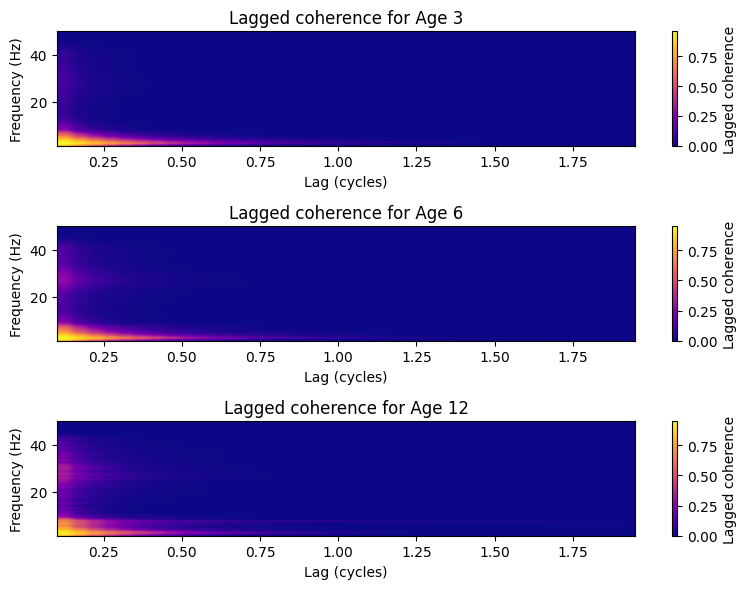

In [20]:
def plot_lagged_coherence(age, freqs, lags, ch_lc):
    plt.imshow(np.nanmean(np.nanmean(ch_lc, axis=1), axis=0), aspect='auto', cmap='plasma', 
               extent=[lags[0], lags[-1], freqs[0], freqs[-1]], 
               origin='lower')
    plt.ylabel('Frequency (Hz)')
    plt.xlabel('Lag (cycles)')
    plt.colorbar(label='Lagged coherence')
    plt.tight_layout()


# Plot coherence across all frequencies with respect to lags for each age group
plt.figure(figsize=(8, 6))

plt.subplot(3, 1, 1)
plot_lagged_coherence(3, freqs, lags, lagged_coh_three)
plt.title('Lagged coherence for Age 3')

plt.subplot(3, 1, 2)
plot_lagged_coherence(6, freqs, lags, lagged_coh_six)
plt.title('Lagged coherence for Age 6')

plt.subplot(3, 1, 3)
plot_lagged_coherence(12, freqs, lags, lagged_coh_twelve)
plt.title('Lagged coherence for Age 12')

plt.tight_layout()
plt.show()

/tmp/ipykernel_55000/1453694169.py:24: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()
/tmp/ipykernel_55000/1453694169.py:17: RuntimeWarning: Mean of empty slice
  coherence_data_avg = np.nanmean(subject_data[:,age_frange,:], axis=(0, 1))  # Moyenne sur les canaux et les fréquences


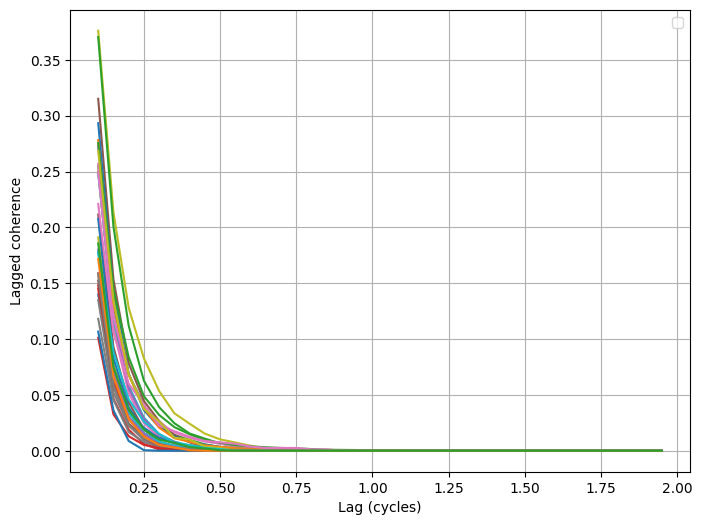

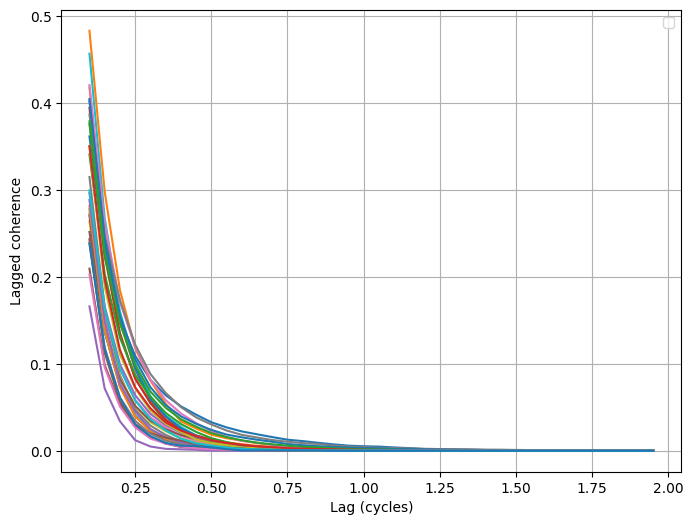

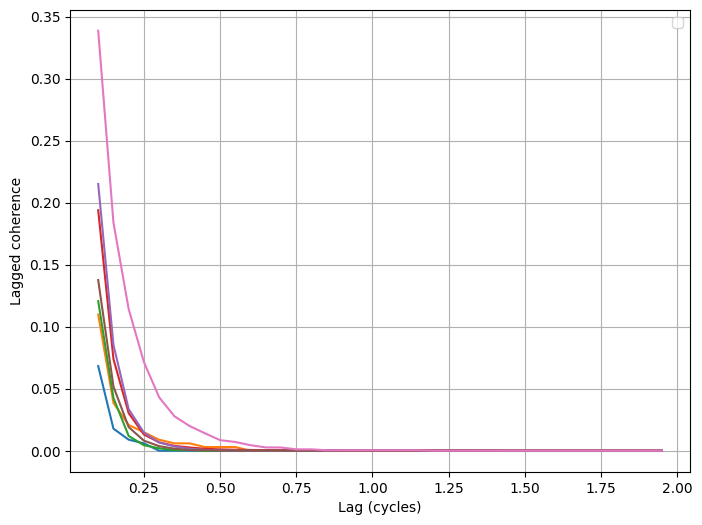

In [22]:
def plot_lagged_coherence_for_each_subject(age, lagged_coh, freqs, lags):
    if age == 3:
        age_frange = np.where((freqs >= 7) & (freqs <= 13))[0]
    elif age == 6:
        age_frange = np.where((freqs >= 6) & (freqs <= 13))[0]
    elif age == 12:
        age_frange = np.where((freqs >= 13) & (freqs <= 18))[0]
    else:
        raise ValueError("Invalid age. Supported ages are 3, 6, and 12.")

    plt.figure(figsize=(8, 6))
            
    for idx, subject_data in enumerate(lagged_coh):
        
        # Moyenne sur les canaux (dim=0) et sur les fréquences (dim=2)
        # tableau est de la forme (n_subjects, n_channels, n_freqs, n_lags)
        coherence_data_avg = np.nanmean(subject_data[:,age_frange,:], axis=(0, 1))  # Moyenne sur les canaux et les fréquences
        
        # Vérifier que la longueur des lags et de la cohérence est la même
        plt.plot(lags, coherence_data_avg)  # Tracer la cohérence en fonction des lags
    plt.xlabel('Lag (cycles)')
    plt.ylabel('Lagged coherence')
    plt.grid(True)
    plt.legend()
    
plot_lagged_coherence_for_each_subject(3, lagged_coh_three, freqs, lags)
plot_lagged_coherence_for_each_subject(6, lagged_coh_six, freqs, lags)
plot_lagged_coherence_for_each_subject(12, lagged_coh_twelve, freqs, lags)


In [41]:
from scipy.optimize import curve_fit
def sigmoid(x, x0, k):
    L=-1
    b=1
    y = L / (1 + np.exp(-k*(x-x0))) + b
    return (y)

beta_lc=np.nanmean(np.nanmean(np.nanmean(lagged_coh_three[:,:,three_frange,:],axis=2),axis=1),axis=0)
p0 = [np.median(lags),3]
popt, pcov = curve_fit(sigmoid, lags, beta_lc, p0, method='lm',maxfev=100000)
x0=popt[0]
k=popt[1]

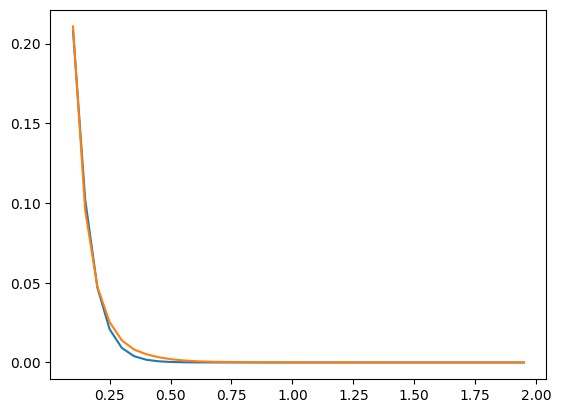

In [42]:
plt.plot(lags, sigmoid(lags, x0, k))
plt.plot(lags, beta_lc)

In [43]:
from scipy.optimize import curve_fit
def sigmoid(x, x0, k):
    L=-1
    b=1
    y = L / (1 + np.exp(-k*(x-x0))) + b
    return (y)

beta_lc=np.nanmean(np.nanmean(np.nanmean(lagged_coh_six[:,:,six_frange,:],axis=2),axis=1),axis=0)
p0 = [np.median(lags),3]
popt, pcov = curve_fit(sigmoid, lags, beta_lc, p0, method='lm',maxfev=100000)
x0=popt[0]
k=popt[1]

/tmp/ipykernel_2306/921206171.py:8: RuntimeWarning: Mean of empty slice
  beta_lc=np.nanmean(np.nanmean(np.nanmean(lagged_coh_six[:,:,six_frange,:],axis=2),axis=1),axis=0)


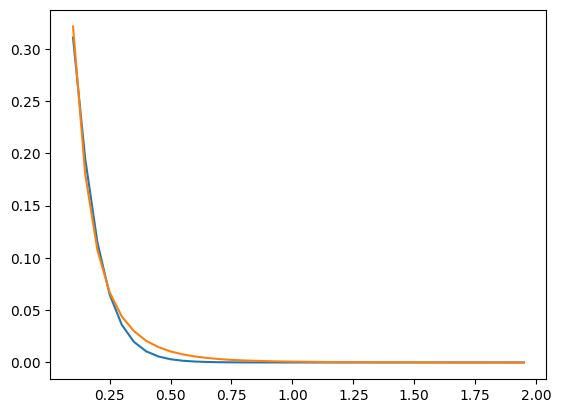

In [44]:
plt.plot(lags, sigmoid(lags, x0, k))
plt.plot(lags, beta_lc)

In [46]:
from scipy.optimize import curve_fit
def sigmoid(x, x0, k):
    L=-1
    b=1
    y = L / (1 + np.exp(-k*(x-x0))) + b
    return (y)

beta_lc=np.nanmean(np.nanmean(np.nanmean(lagged_coh_twelve[:,:,twelve_frange,:],axis=2),axis=1),axis=0)
p0 = [np.median(lags),3]
popt, pcov = curve_fit(sigmoid, lags, beta_lc, p0, method='lm',maxfev=100000)
x0=popt[0]
k=popt[1]

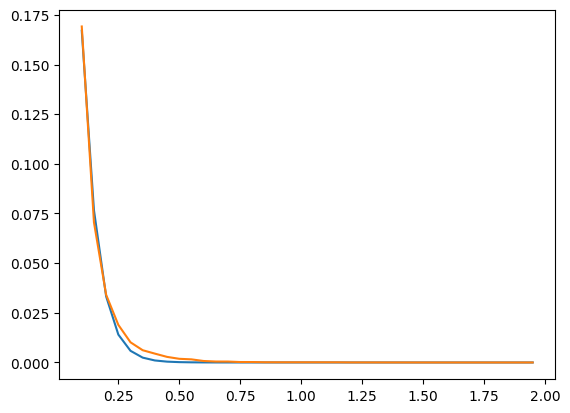

In [47]:
plt.plot(lags, sigmoid(lags, x0, k))
plt.plot(lags, beta_lc)

Pour l'âge 3 mois : x0 = 0.02010354207630233, k = 16.732472844329106
Pour l'âge 6 mois : x0 = 0.03599597339088853, k = 12.442103051105624
Pour l'âge 12 mois : x0 = 0.008824954927901765, k = 17.62684493380306


/tmp/ipykernel_2306/669951837.py:39: RuntimeWarning: Mean of empty slice
  beta_lc_six = np.nanmean(np.nanmean(np.nanmean(lagged_coh_six[:, :, six_frange, :], axis=2), axis=1), axis=0)


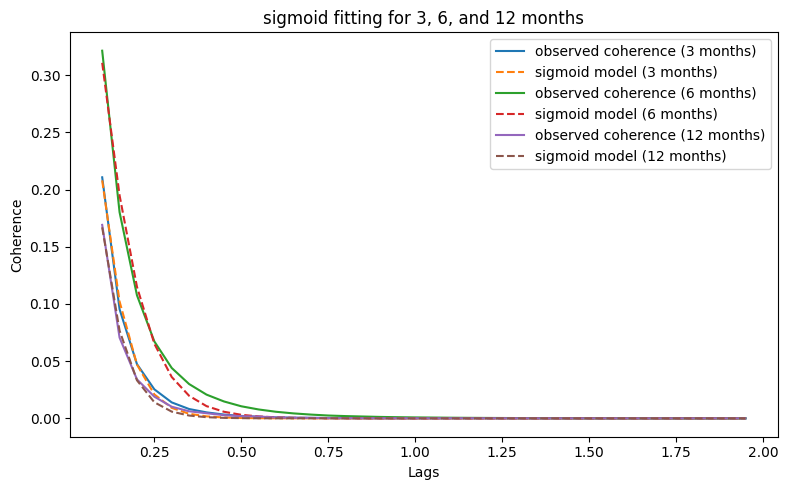

In [48]:
from scipy.optimize import curve_fit
import numpy as np
import matplotlib.pyplot as plt

def sigmoid(x, x0, k):
    L = -1
    b = 1
    y = L / (1 + np.exp(-k * (x - x0))) + b
    return y

def fit_sigmoid_for_age(lags, coh_data, p0=None):
    """
    Ajuste la fonction sigmoïde sur les données de cohérence pour un groupe d'âge donné.

    lags : vecteur des lags
    coh_data : données de cohérence pour un groupe d'âge donné
    p0 : paramètres initiaux pour la fonction sigmoïde
    """
    if p0 is None:
        p0 = [np.median(lags), 3]  

    popt, _ = curve_fit(sigmoid, lags, coh_data, p0, method='lm', maxfev=100000)
    
    x0 = popt[0]
    k = popt[1]
    
    return x0, k

beta_lc_three = np.nanmean(np.nanmean(np.nanmean(lagged_coh_three[:, :, three_frange, :], axis=2), axis=1), axis=0)
x0_three, k_three = fit_sigmoid_for_age(lags, beta_lc_three)
print(f"Pour l'âge 3 mois : x0 = {x0_three}, k = {k_three}")

beta_lc_six = np.nanmean(np.nanmean(np.nanmean(lagged_coh_six[:, :, six_frange, :], axis=2), axis=1), axis=0)
x0_six, k_six = fit_sigmoid_for_age(lags, beta_lc_six)
print(f"Pour l'âge 6 mois : x0 = {x0_six}, k = {k_six}")

beta_lc_twelve = np.nanmean(np.nanmean(np.nanmean(lagged_coh_twelve[:, :, twelve_frange, :], axis=2), axis=1), axis=0)
x0_twelve, k_twelve = fit_sigmoid_for_age(lags, beta_lc_twelve)
print(f"Pour l'âge 12 mois : x0 = {x0_twelve}, k = {k_twelve}")

plt.figure(figsize=(8, 5))

plt.plot(lags, beta_lc_three, label='observed coherence (3 months)')
plt.plot(lags, sigmoid(lags, x0_three, k_three), label='sigmoid model (3 months)', linestyle='--')

plt.plot(lags, beta_lc_six, label='observed coherence (6 months)')
plt.plot(lags, sigmoid(lags, x0_six, k_six), label='sigmoid model (6 months)', linestyle='--')

plt.plot(lags, beta_lc_twelve, label='observed coherence (12 months)')
plt.plot(lags, sigmoid(lags, x0_twelve, k_twelve), label='sigmoid model (12 months)', linestyle='--')

plt.xlabel('Lags')
plt.ylabel('Coherence')
plt.title('sigmoid fitting for 3, 6, and 12 months')
plt.legend()
plt.tight_layout()
plt.show()

In [47]:
def plot_lagged_coherence (age, freqs, ch_lc): 

    if age == 'three':
        file_path = 'frequency_ranges_three.json'
    elif age == 'six':
        file_path = 'frequency_ranges_six.json'
    elif age == 'twelve':
        file_path = 'frequency_ranges_twelve.json'
    else:
        raise ValueError("Invalid age")

    if not os.path.exists(file_path):
        raise FileNotFoundError(f"The file {file_path} does not exist.")

    # Check if the file is empty
    if os.path.getsize(file_path) == 0:
        raise ValueError(f"The file {file_path} is empty.")

    with open(file_path, 'r') as json_file:
        try:
            frequency_ranges = json.load(json_file)
        except json.JSONDecodeError as e:
            raise ValueError(f"Error decoding JSON from file {file_path}: {e}")
    
    print(frequency_ranges)  

    if 'FOI_2' not in frequency_ranges:
        raise ValueError(f"FOI_2 not found in the JSON file {file_path}")

    age_frange=frequency_ranges['FOI_2']['frequency_range']

    l_idx = np.where(freqs >= age_frange[0])[0][0]
    r_idx = np.where(freqs <= age_frange[1])[0][-1]

    plt.figure()
    plt.subplot(2, 1, 1)
    plt.plot(lags, np.nanmean(np.nanmean(ch_lc[:, l_idx:r_idx+1, :], axis=1), axis=0))
    plt.xlabel('Lag (cycles)')
    plt.ylabel('Lagged coherence')
    plt.title(f'Lagged coherence for age {age}')

    plt.subplot(2, 1, 2)
    plt.imshow(np.nanmean(ch_lc, axis=0), aspect='auto', cmap='plasma', 
               extent=[lags[0], lags[-1], freqs[0], freqs[-1]], 
               origin='lower')
    plt.ylabel('Frequency (Hz)')
    plt.xlabel('Lag (cycles)')
    plt.colorbar(label='Lagged coherence')
    plt.tight_layout()

    return age_frange